# New York City Train System Expected Years of Station Closure

Using the Train Systems of the World dataset we will be looking at the probabilities of which New York City train stations are likely to close in the forseeable future. 




In [1]:
# Basic imports.
import pandas as pd
import numpy as np
import plotly.express as px

## Gathering the datasets

In [2]:
cities = pd.read_csv('https://raw.githubusercontent.com/stefanoruiz/datasets/master/transit-systems-of-the-world/cities.csv')
lines = pd.read_csv('https://raw.githubusercontent.com/stefanoruiz/datasets/master/transit-systems-of-the-world/lines.csv')
station_lines = pd.read_csv('https://raw.githubusercontent.com/stefanoruiz/datasets/master/transit-systems-of-the-world/station_lines.csv')
stations = pd.read_csv('https://raw.githubusercontent.com/stefanoruiz/datasets/master/transit-systems-of-the-world/stations.csv')

systems = pd.read_csv('https://raw.githubusercontent.com/stefanoruiz/datasets/master/transit-systems-of-the-world/systems.csv')
track_lines = pd.read_csv('https://raw.githubusercontent.com/stefanoruiz/datasets/master/transit-systems-of-the-world/track_lines.csv')
tracks = pd.read_csv('https://raw.githubusercontent.com/stefanoruiz/datasets/master/transit-systems-of-the-world/tracks.csv')


## Pre-processing

Separating and cleaning the data. We will only be needing the data relating to NYC (New York City) and ommitting the rest. 

In [3]:
# Splitting latitude and longitude into two separate workable coordinate points. 

stations.columns = ['id','stations_name','geometry','buildstart','opening','closure','city_id']
stations['Longitude'] = stations['geometry'].apply(lambda x: x.split('POINT(')[1].split(' ')[0])
stations['Latitude'] = stations['geometry'].apply(lambda x: x.split('POINT(')[1].split(' ')[1].split(')')[0])

In [4]:
# Dropping geometry since it is a redundant feature.
stations = stations.drop(columns='geometry')
id_country = pd.DataFrame({'city_id':cities.id,'country':cities.country,'name':cities.name})
stations = pd.merge(stations,id_country)

In [5]:
# Turning Latitude and Longitude from objects into floats.

stations['Latitude'] = stations['Latitude'].astype(str).astype(float)
stations['Longitude'] = stations['Longitude'].astype(str).astype(float)

In [6]:
# Check for float type for Latitude and Longitude. 
stations.dtypes

id                 int64
stations_name     object
buildstart       float64
opening          float64
closure          float64
city_id            int64
Longitude        float64
Latitude         float64
country           object
name              object
dtype: object

In [7]:
id_lines = pd.DataFrame({'city_id':lines.city_id, 'lines_id':lines.id, 'lines_name':lines.name })

In [8]:
stations = pd.merge(stations, id_lines)

In [9]:
ny_stations = stations.dropna(subset=['closure','name','opening'])
ny_stations = stations[stations.closure>=9999]
ny_stations = stations[stations.opening>0]
ny_stations = stations[stations.opening<=2030]

ny_lines = lines[lines.city_id == 206]
ny_track_lines = track_lines[track_lines.city_id == 206]
ny_tracks = tracks[tracks.city_id == 206].drop(columns=['buildstart','opening','closure','city_id'])

ny_tracks.columns = ['section_id','geometry','length']
ny_track_lines = pd.merge(ny_track_lines, ny_tracks)
ny_track_lines = ny_track_lines.drop(columns=['id','created_at','updated_at','city_id'])

ny_track_lines.columns = ['section_id','id','geometry','length']
ny_lines = pd.merge(ny_track_lines, ny_lines)
ny_stations = stations[stations['city_id'] == 206]


Using *plotly mapbox* we can get a clear representation of all stations that are open and closed. Stations.csv dataset labels all stations still open with **999,999** and all stations that are now closed as the year they close (i.e Ridgeway Station, Closure: 1937). 

**Creation of Boolean Closure Feature**

In [10]:
# New improved CSV. Edited on excel because of merging issues with Pandas. 

ny_stations = pd.read_csv('https://raw.githubusercontent.com/stefanoruiz/datasets/master/transit-systems-of-the-world/ny_stations.csv',index_col=0)

In [11]:
ny_stations.dtypes

id                 int64
stations_name     object
buildstart         int64
opening            int64
city_id            int64
Longitude        float64
Latitude         float64
country           object
name              object
lines_id           int64
lines_name        object
closure            int64
bool_closure        bool
dtype: object

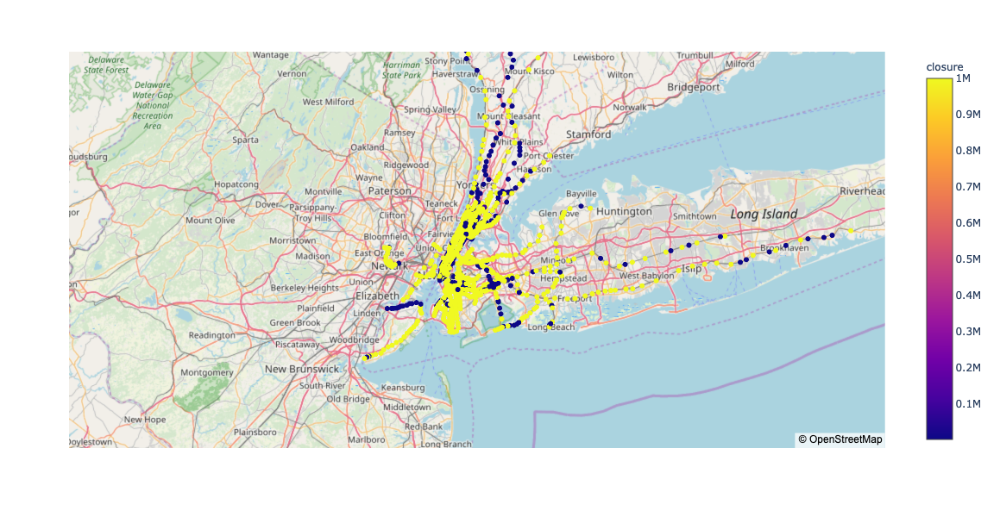

In [12]:
fig = px.scatter_mapbox(ny_stations, lat="Latitude", lon="Longitude", hover_name="stations_name", color='closure')
fig.update_layout(mapbox_style="open-street-map")
fig.show()

## Baselines for the closure model.


In [13]:
### One-Hot-Encoding using Category Encoders

In [14]:
import category_encoders as ce
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [15]:
def onehotencoding(X, y):
    onehot = ce.OneHotEncoder()
    output = onehot.fit(X, y)
    feature_names = output.get_feature_names()
    arr = output.transform(X)
    
    return  feature_names, arr

In [16]:
feature = ['id', 'stations_name', 'buildstart', 'opening', 'Longitude', 'Latitude', 'lines_id', 'lines_name']
target = 'closure'

In [17]:
X = ny_stations[feature]
y = ny_stations[target]

In [18]:
feature_names, arr = onehotencoding(X,y)

In [19]:
X_trainval, X_test, y_trainval, y_test = train_test_split(arr, y, train_size=.80, test_size=.20, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_trainval, y_trainval, train_size=.80, test_size=.20, random_state=42)

In [20]:
print('X_train shape', X_train.shape)
print('y_train shape', y_train.shape)
print('X_val shape', X_val.shape)
print('y_val shape', y_val.shape)
print('X_test shape', X_test.shape)
print('y_test shape', y_test.shape)


X_train shape (51430, 913)
y_train shape (51430,)
X_val shape (12858, 913)
y_val shape (12858,)
X_test shape (16072, 913)
y_test shape (16072,)


In [21]:
pd.options.display.float_format = None
y_train.value_counts(normalize=True);

In [22]:
majority_class = y_train.mode()[0]
y_pred = np.full_like(y_val, fill_value=majority_class)
baseline_score = accuracy_score(y_val, y_pred)
print('Baseline score: ', accuracy_score(y_val, y_pred))

Baseline score:  0.6294135946492456


In [74]:
from sklearn.metrics import mean_absolute_error

In [76]:
mea = mean_absolute_error

## First Model - Linear Regression Model

In [23]:
from sklearn.linear_model import LinearRegression

In [45]:
def linear_model(X, y, baseline):
    """X, y, baseline as arguments, 
    outputs print message with score"""
    reg = LinearRegression()
    reg.fit(X, y)
    reg.predict(X)
    
    if baseline > reg.score(X, y):
        print('Model does not beat baseline: ', baseline)
        print('Linear Regression Model Score: ', reg.score(X, y))
    else:
        print(baseline)
        print('Model exceeds baseline: ', reg.score(X, y))

In [46]:
linear_model(X_train, y_train, baseline_score)

0.6294135946492456
Model exceeds baseline:  0.7942449352930194


### Ordinal Encoder Pipeline

In [89]:

import category_encoders as ce
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
import matplotlib.pyplot as plt

In [91]:
ordinal_pipeline = make_pipeline(
    ce.OrdinalEncoder(),
    SimpleImputer(strategy='median'),
    RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
)

ordinal_pipeline.fit(X_train, y_train)
print('Validation Accuracy', ordinal_pipeline.score(X_val, y_val))

Validation Accuracy 1.0


In [94]:
ordinal_pipeline = make_pipeline(
    ce.OrdinalEncoder(),
    SimpleImputer(strategy='median'),
    RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
)

ordinal_pipeline.fit(X_train, y_train)
print('Validation Accuracy', ordinal_pipeline.score(X_val, y_val))

Validation Accuracy 1.0


### Seaborn Scatter Plot

In [62]:
nyc_stations = pd.DataFrame(ny_stations['opening'])

In [63]:
nyc_stations['buildstart'] = ny_stations['buildstart']

In [66]:
ny_stations[ny_stations.closure < 9999]

,id,stations_name,buildstart,opening,city_id,Longitude,Latitude,country,name,lines_id,lines_name,closure,bool_closure
882997,13713,Sands Street,1888,1888,206,-73.990060,40.699996,United States,New York,745,Broadway-7th Avenue Line,1944,False
882998,13713,Sands Street,1888,1888,206,-73.990060,40.699996,United States,New York,1227,2nd Avenue Line,1944,False
882999,13713,Sands Street,1888,1888,206,-73.990060,40.699996,United States,New York,1217,6th Avenue Line,1944,False
883000,13713,Sands Street,1888,1888,206,-73.990060,40.699996,United States,New York,1219,3rd Avenue Line,1944,False
883001,13713,Sands Street,1888,1888,206,-73.990060,40.699996,United States,New York,1267,Culver Line,1944,False
883002,13713,Sands Street,1888,1888,206,-73.990060,40.699996,United States,New York,1237,Harlem Line,1944,False
883003,13713,Sands Street,1888,1888,206,-73.990060,40.699996,United States,New York,1230,Jerome Avenue Line,1944,False
883004,13713,Sands Street,1888,1888,206,-73.990060,40.699996,United States,New York,1225,Port Chester Line,1944,False
883005,13713,Sands Street,1888,1888,206,-73.990060,40.699996,United States,New York,1224,White Plains Line,1944,False
883006,13713,Sands Street,1888,1888,206,-73.990060,40.699996,United States,New York,1226,Harlem River Line,1944,False


In [96]:
print(ny_stations.shape)
ny_stations.head(5)

(80360, 13)


,id,stations_name,buildstart,opening,city_id,Longitude,Latitude,country,name,lines_id,lines_name,closure,bool_closure
882997,13713,Sands Street,1888,1888,206,-73.99006,40.699996,United States,New York,745,Broadway-7th Avenue Line,1944,False
882998,13713,Sands Street,1888,1888,206,-73.99006,40.699996,United States,New York,1227,2nd Avenue Line,1944,False
882999,13713,Sands Street,1888,1888,206,-73.99006,40.699996,United States,New York,1217,6th Avenue Line,1944,False
883000,13713,Sands Street,1888,1888,206,-73.99006,40.699996,United States,New York,1219,3rd Avenue Line,1944,False
883001,13713,Sands Street,1888,1888,206,-73.99006,40.699996,United States,New York,1267,Culver Line,1944,False


In [99]:
print(arr.shape)
arr.head(5)

(80360, 913)


,id,stations_name_1,stations_name_2,stations_name_3,stations_name_4,stations_name_5,stations_name_6,stations_name_7,stations_name_8,stations_name_9,...,lines_name_53,lines_name_54,lines_name_55,lines_name_56,lines_name_57,lines_name_58,lines_name_59,lines_name_60,lines_name_61,lines_name_62
882997,13713,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
882998,13713,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
882999,13713,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
883000,13713,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
883001,13713,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [67]:
nyc_stations = ny_stations[ny_stations.closure < 9999]

In [70]:
nyc_stations = nyc_stations[['opening', 'buildstart', 'closure']]

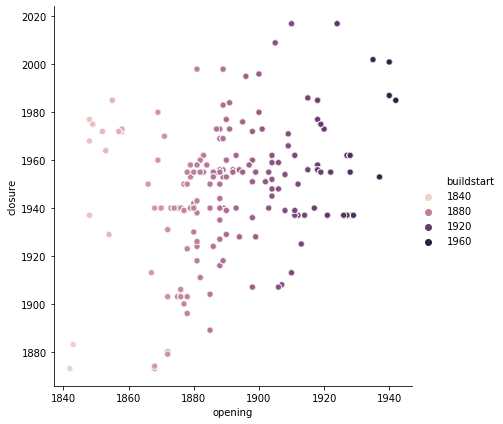

In [73]:
sns.relplot(x="opening", y="closure", hue="buildstart", sizes=(40, 400), alpha=.5, height=6, data=nyc_stations)